<a href="https://colab.research.google.com/github/MWH997/Exploration-And-Analysis-of-Crime-Data-From-Nothern-Ireland/blob/master/Exploration_And_Analysis_of_Crime_Data_From_Nothern_Ireland.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<center>

# Exploration And Analysis of Crime Data From Nothern Ireland

## MD WAHID HASSAN

<center>

The dataset used in the project is obtained from the website [Police.UK](https://police.uk). The dataset consist of multiple CSV files containing information about the criminal activity occurring in the Nothern Ireland part of the United Kingdom, from `December 2019` to `November 2022`
Throughout this project we will have an extensive look inside the dataset, performing analysis and visualization to craft a story from the data.

Before we start, there are a few things that should be mentioned upfront.
- The project was developed using Google Colab which is hosted on a debian based Linux distro. It is highly recommend that the project be run on Google Colab or at least on a computer that has a debian based operating system.
- The python libraries that are used are up to date, except for `pystan` which needed to be downgraded for `fbprophet` to work correctly.
- The cell below the `clear_output` import statement cell takes quite a bit of time to install all of the dependecies to be installed.
- Most the cells of the Notebook have comments written with the code to explain its functionality.
- The notebook is divided into parts and hence, each part/section will have its own introduction and conclusion.
- The original data was presented in a zip file which was uploaded to the Google Drive. So please upload the data file to the Google Drive.

## Initial Setup

In [ ]:
# `clear_output()` is imported from the IPython.display library.

from IPython.display import clear_output

In [ ]:
# Installing some OS lever packages and also essential Python packages using `pip`.

!apt-get install texlive
!apt-get install texlive-xetex
!apt-get install texlive-latex-extra
!apt-get install pandoc
!pip install pypandoc
!pip install -U scikit-fuzzy
!pip install geopandas
!pip install pystan~=2.14
!pip install fbprophet
clear_output()

In [ ]:
# Importing the required libraries.

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import sklearn as sk
import os, folium, warnings, glob, shutil, time
from folium import plugins
warnings.filterwarnings('ignore')
%matplotlib inline
import seaborn as sns
from scipy.stats import norm
from sklearn.preprocessing import OneHotEncoder, MinMaxScaler
from skfuzzy import cluster
from pathlib import Path
import geopandas as gpd
from shapely.geometry import Point
from google.colab import drive

In [ ]:
# Mounting the Google Drive storage.

drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# Copying files to the current working directory.

!cp './drive/MyDrive/PoliceUKData/NorthernIrelandPoliceData.zip' './'

In [ ]:
# Check whether the folder already exists or not. Unzipping the contents into the folder.

if os.path.exists('./data'):
  shutil.rmtree('./data')
  os.makedirs('./data')
else:
  os.makedirs('./data')
shutil.unpack_archive('./NorthernIrelandPoliceData.zip', './data')
clear_output()

In [ ]:
# Reading all csv files.

csv_folder = Path('./data')
df = pd.concat(pd.read_csv(p) for p in csv_folder.glob('**/*.csv'))


In [ ]:
df.head(4)

,Crime ID,Month,Reported by,Falls within,Longitude,Latitude,Location,LSOA code,LSOA name,Crime type,Last outcome category,Context
0,NaN,2021-07,Police Service of Northern Ireland,Police Service of Northern Ireland,-5.896018,54.229479,On or near Carrigs Road,NaN,NaN,Anti-social behaviour,NaN,NaN
1,NaN,2021-07,Police Service of Northern Ireland,Police Service of Northern Ireland,-5.824606,54.870866,On or near Cairnbeg Park,NaN,NaN,Anti-social behaviour,NaN,NaN
2,NaN,2021-07,Police Service of Northern Ireland,Police Service of Northern Ireland,-6.035149,54.588555,On or near Glenmeen Close,NaN,NaN,Anti-social behaviour,NaN,NaN
3,NaN,2021-07,Police Service of Northern Ireland,Police Service of Northern Ireland,-5.739634,54.667165,On or near Golf Road,NaN,NaN,Anti-social behaviour,NaN,NaN


## Basic Exploration

Here simple `pandas` built-in functions are being to used to get a better understanding of the dataset.

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 485934 entries, 0 to 13154
Data columns (total 12 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   Crime ID               301238 non-null  object 
 1   Month                  485934 non-null  object 
 2   Reported by            485934 non-null  object 
 3   Falls within           485934 non-null  object 
 4   Longitude              480122 non-null  float64
 5   Latitude               480122 non-null  float64
 6   Location               485934 non-null  object 
 7   LSOA code              0 non-null       float64
 8   LSOA name              0 non-null       float64
 9   Crime type             485934 non-null  object 
 10  Last outcome category  0 non-null       float64
 11  Context                0 non-null       float64
dtypes: float64(6), object(6)
memory usage: 48.2+ MB


In [ ]:
df.describe()

,Longitude,Latitude,LSOA code,LSOA name,Last outcome category,Context
count,480122.000000,480122.000000,0.0,0.0,0.0,0.0
mean,-6.288288,54.623646,NaN,NaN,NaN,NaN
std,0.533829,0.233233,NaN,NaN,NaN,NaN
min,-8.148313,54.026858,NaN,NaN,NaN,NaN
25%,-6.576914,54.508453,NaN,NaN,NaN,NaN
50%,-6.032328,54.597254,NaN,NaN,NaN,NaN
75%,-5.925910,54.716732,NaN,NaN,NaN,NaN
max,-5.437560,55.240074,NaN,NaN,NaN,NaN


In [ ]:
print(df['Crime type'].value_counts())

Anti-social behaviour           184696
Violence and sexual offences    141668
Criminal damage and arson        51411
Other theft                      27619
Drugs                            24688
Shoplifting                      16591
Burglary                         12080
Other crime                       8443
Vehicle crime                     7696
Public order                      3394
Possession of weapons             3305
Bicycle theft                     2125
Robbery                           1445
Theft from the person              773
Name: Crime type, dtype: int64


In [ ]:
print('\n--------------------------------------------\n')
print(df['Reported by'].value_counts())
print('\n--------------------------------------------\n')
print(df['Falls within'].value_counts())
print('\n--------------------------------------------\n')
print(df['Location'].value_counts())


--------------------------------------------

Police Service of Northern Ireland    485934
Name: Reported by, dtype: int64

--------------------------------------------

Police Service of Northern Ireland    485934
Name: Falls within, dtype: int64

--------------------------------------------

On or near                     65281
No Location                     5812
On or near Main Street          4445
On or near High Street          2525
On or near Castle Street        1870
                               ...  
On or near Mullyneill Road         1
On or near Cooley Road             1
On or near Laburnum Road           1
On or near Mussenden Grange        1
On or near Cranagh Road            1
Name: Location, Length: 14875, dtype: int64


After going through the dataset and figuring out a lot of misgivings, the decision was made. Due to them having the same entry for all the crime data, `Reported by` and `Falls within` have been decided to be removed from the dataframe. `Location` is also removed as the `Latitude` and `Longitude` do the same job.

## Data Transformation

For this part, our columns of interest are seperated from all other columns. The `dataframe` is then used to check whether there are any null values in the `dataframe`.

In [ ]:
# Refine the pandas dataframe.

df = df[['Month','Longitude','Latitude','Crime type']]

In [ ]:
# Looking for null values.

df.isnull().sum()

Month            0
Longitude     5812
Latitude      5812
Crime type       0
dtype: int64

In [ ]:
# The null values that are left.

df.dropna(inplace=True)
df['Month'] = pd.to_datetime(df['Month'])

In [ ]:
# Making a backup copy of the processed data from various types of work to come.

f_df = df.copy()

The null values are dropped because compared to the size of the dataset, the amount of null values weren't that much and so it was logical to drop the rows with null entries. After that, a copy of the `dataframe` is kept to refresh the `dataframe` while going all those tasks.

## Exploratory Data Analysis

In this part `folium` and `geopandas` are used to generate maps containing crime data. There is also a stacked column chart to demonstrate the distribution crime types grouped by `Year`. We also plot `Longitude` and `Latitude` in seperate histogram to look at their distribution.

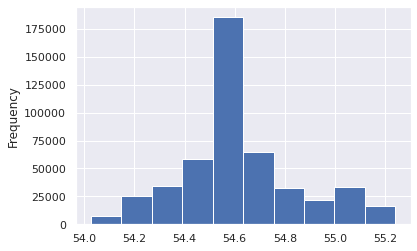

In [ ]:
df['Latitude'].plot(kind='hist')

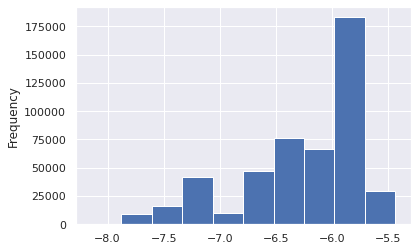

In [ ]:
df['Longitude'].plot(kind='hist')

In [ ]:
# Create a map object
m = folium.Map(location=[df['Latitude'].mean(), df['Longitude'].mean()], zoom_start=8,height='80%',width='80%')

# Add a heatmap for crime location
plugins.HeatMap(data=df[['Latitude', 'Longitude']], name = 'Crime Density').add_to(m)

# Show the map
m


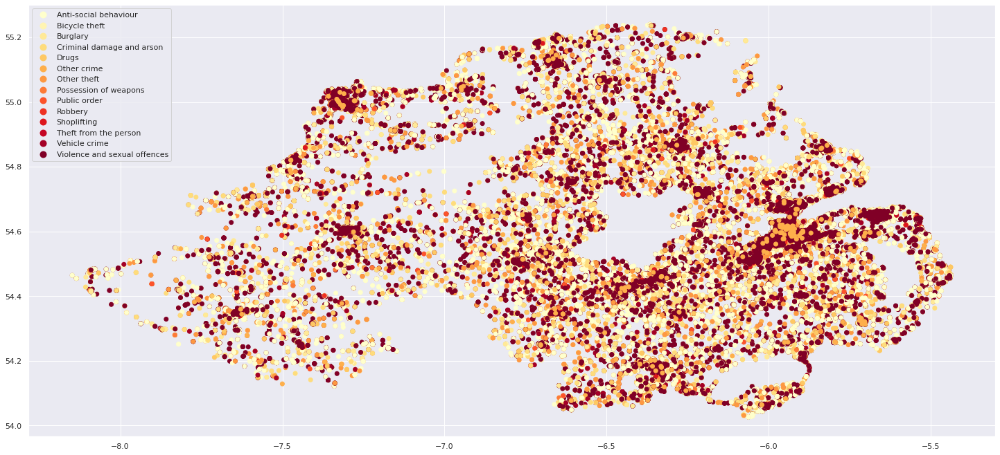

In [ ]:
# convert to a geodataframe
df['geometry'] = df.apply(lambda x: Point(x.Longitude, x.Latitude), axis=1)
gdf = gpd.GeoDataFrame(df, geometry='geometry')

# Plot the data
gdf.plot(column='Crime type', categorical=True, legend=True, cmap='YlOrRd',figsize=(25,25),kind='geo')

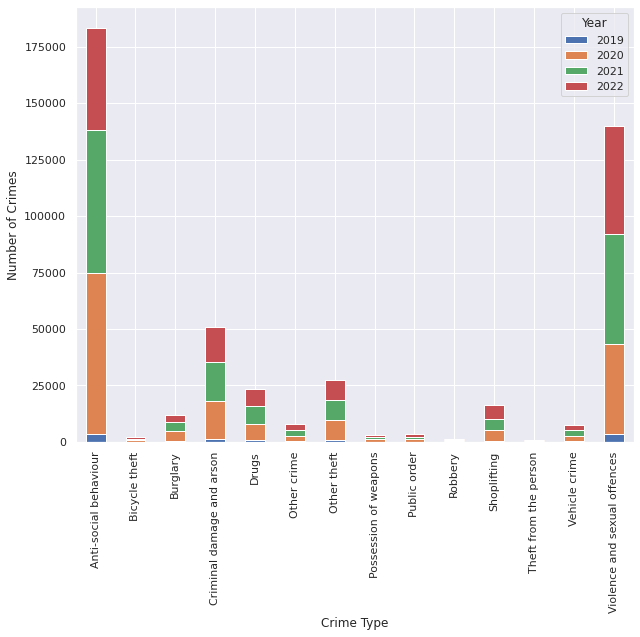

In [ ]:
df['Year'] = df['Month'].dt.year

# Group the data by year and crime type
yearly_data = df.groupby(['Year', 'Crime type']).size().reset_index(name='counts')

# Pivot the data to have the year as columns and crime types as rows
pivot_data = yearly_data.pivot(index='Crime type', columns='Year', values='counts')

# Plot the data
pivot_data.plot(kind='bar', stacked=True, figsize=(10,8))
plt.xlabel('Crime Type')
plt.ylabel('Number of Crimes')
plt.legend(title='Year')
plt.show()

From the `folium` and `geopandas` maps, we can gather a bigger persecptive on how rampant crime is in the Nothern Ireland. Some interesting insights were found from the stacked column chart.
Below are our findings from the chart.
- Anti-social behaviour say a rampant increase and that might be due to Covid.
- Violence and sexual offences are also very in the Northern Ireland.
- Apart from these all others seem to be steady over the span of years.

## Statistical Tests

In this section, three hypothesis are tested on the `dataframe` obtained from the `dataset`.

1. Chi-square test for independence:
The null hypothesis for this test is that there is no association between the two categorical variables being tested (e.g. crime type and month). The alternative hypothesis is that there is an association between the two variables. Formally, the null and alternative hypotheses for this test are:

        H0: The crime type and month are independent
        Ha: The crime type and month are not independent

2. t-test:
The null hypothesis for this test is that there is no significant difference in the means of the two numerical variables being tested (e.g. latitude and longitude). The alternative hypothesis is that there is a significant difference in the means of the two variables. Formally, the null and alternative hypotheses for this test are:
        
        H0: The mean of latitude is equal to the mean of longitude
        Ha: The mean of latitude is not equal to the mean of longitude

3. ANOVA:
The null hypothesis for this test is that there is no significant difference in the means of the numerical variables being tested (e.g. latitude) among different levels of the categorical variable (e.g. crime type). The alternative hypothesis is that there is a significant difference in the means of the numerical variables among different levels of the categorical variable. Formally, the null and alternative hypotheses for this test are:

        H0: The means of latitude among different crime types are equal
        Ha: The means of latitude among different crime types are not equal

### ST-1

In [ ]:
from scipy.stats import chi2_contingency

# Create a cross-tabulation of crime type and month
table = pd.crosstab(df['Crime type'], df['Month'].dt.month)

# Run the chi-square test
stat, p, dof, expected = chi2_contingency(table)

# Print the p-value
print("p-value: ", p)

p-value:  0.0


### ST-2

In [ ]:
from scipy.stats import ttest_ind

# Select the latitude and longitude columns
latitude = df['Latitude']
longitude = df['Longitude']

# Run the t-test
stat, p = ttest_ind(latitude, longitude)

# Print the p-value
print("p-value: ", p)

p-value:  0.0


### ST-3

In [ ]:
from scipy.stats import f_oneway

# Create a new dataframe with the latitude, longitude, and crime type columns
df_new = df[['Latitude', 'Longitude', 'Crime type']]

# Run the ANOVA test
stat, p = f_oneway(df_new[df_new['Crime type'] == 'Drugs']['Latitude'],
                  df_new[df_new['Crime type'] == 'Shoplifting']['Latitude'],
                  df_new[df_new['Crime type'] == 'Burglary']['Latitude'])

# Print the p-value
print("p-value: ", p)

p-value:  1.3232303821720914e-17


For all of the three hypothesis tests, the null hypothesis was rejected in the favour of the alternate hypothesis, as the p value are extremely low and are obviously lower the alpha of `0.05`.

In [ ]:
df = f_df.copy()

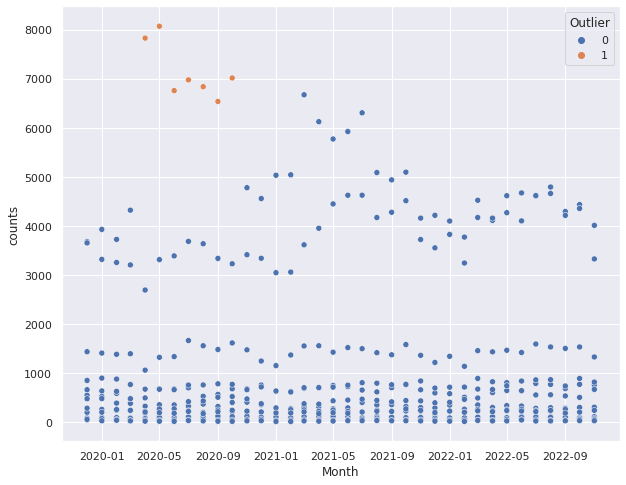

In [ ]:
# Group the data by month and crime type
monthly_data = df.groupby(['Month','Crime type']).size().reset_index(name='counts')
# Calculate the mean and standard deviation for each month
monthly_data['mean'] = monthly_data.groupby(['Month'])['counts'].transform('mean')
monthly_data['std'] = monthly_data.groupby(['Month'])['counts'].transform('std')
# Calculate the Z-score for each data point
monthly_data['z_score'] = (monthly_data['counts'] - monthly_data['mean']) / monthly_data['std']
# Identify the outliers
monthly_data['Outlier'] = np.where(np.abs(monthly_data['z_score']) > 3, 1, 0)
# Visualize the outliers
sns.set(rc={'figure.figsize':(10,8)})
sns.scatterplot(x='Month', y='counts', hue='Outlier', data=monthly_data)
plt.show()

From the graph above we can determine that the data has a small amount of outliers in it and it should not be of concern to anyone.

In [ ]:
df = f_df.copy()

## Seasonal Decomposition And Trend Analysis

The `seasonal_decompose` from the library of time series analysis was applied to the `dataframe`.
Additionally, many graphs and charts are put in place to determine whether is a seasonal trend associated towards the data.

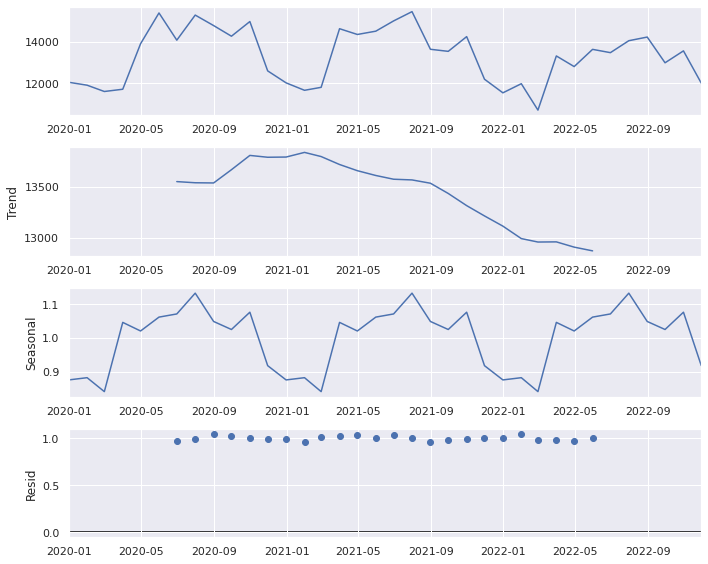

In [ ]:
from statsmodels.tsa.seasonal import seasonal_decompose
# Create a time series object
crime_ts = df.set_index('Month')
# Resample the data by month
monthly_data = crime_ts.resample('M').size()
# Perform time series decomposition
result = seasonal_decompose(monthly_data, model='multiplicative')
# Plot the data
result.plot()
plt.show()

We end up finding strong seasonallity as evident by the graph.

In [ ]:
df = f_df.copy()

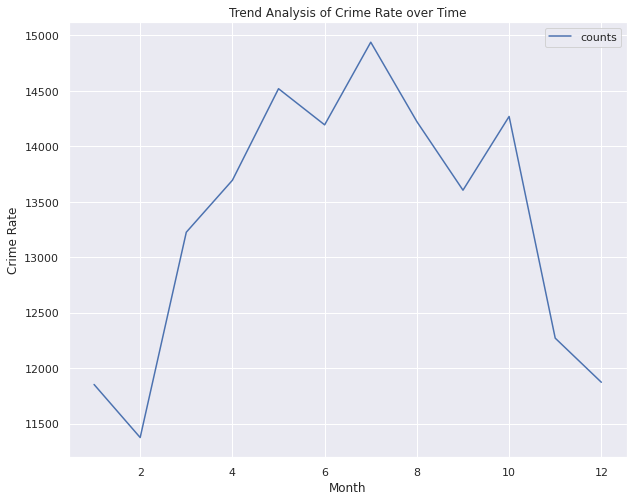

In [ ]:
# Group the data by month and year
df['Year'] = df['Month'].dt.year
df['Month'] = df['Month'].dt.month
monthly_data = df.groupby(['Month','Year']).size().reset_index(name='counts')

# Calculate the mean crime rate for each month across the years
monthly_data = monthly_data.groupby(['Month']).mean().reset_index()

# Create a line chart of the crime rate over time
monthly_data.plot(x='Month', y='counts', kind='line',figsize=(10,8))
plt.xlabel('Month')
plt.ylabel('Crime Rate')
plt.title('Trend Analysis of Crime Rate over Time')
plt.show()

In [ ]:
df = f_df.copy()

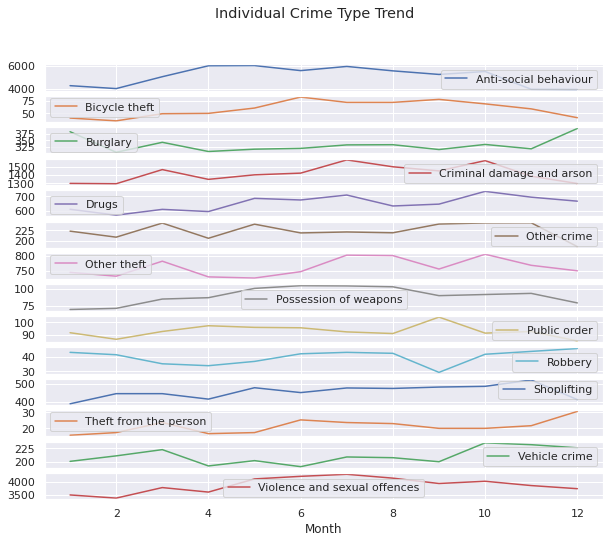

In [ ]:
# Group the data by month, crime type and year
df['Year'] = df['Month'].dt.year
df['Month'] = df['Month'].dt.month
monthly_data = df.groupby(['Month','Crime type','Year']).size().reset_index(name='counts')

# Calculate the mean for each crime type and month across the years
monthly_data = monthly_data.groupby(['Month','Crime type']).mean().reset_index()

# Create a pivot table to show the average number of crimes for each crime type and month
pivot_table = monthly_data.pivot_table(values='counts', index='Month', columns='Crime type', aggfunc='mean')
# Create a line chart of the pivot table
pivot_table.plot(kind='line', subplots=True, layout=(len(pivot_table.columns),1), figsize=(10,8),title='Individual Crime Type Trend')
plt.show()

In [ ]:
df = f_df.copy()

From both trend analysis based on overall crime rate and that of individual crime type, we can safely determine that some of types of crime have a specific seasonal trend towards the occurences. It almost feels like the perpertrators sit out some months and then hit again, causing the trend to move along with them.

## Forecasting Using FbProphet

This is automated forecasting tool that I think can be useful when it comes to anticipating rises in types of crime.

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


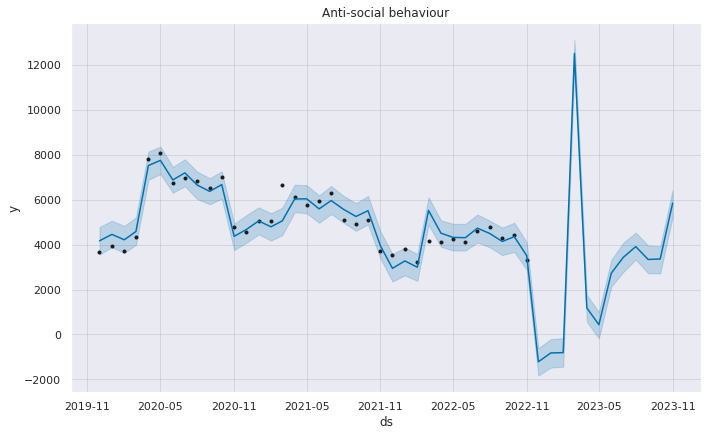

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


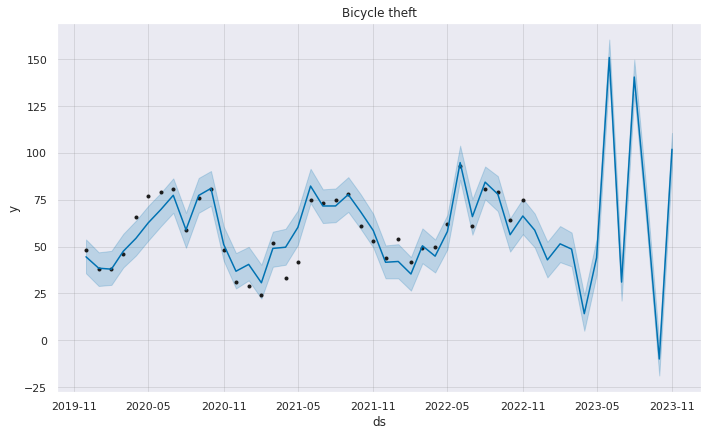

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


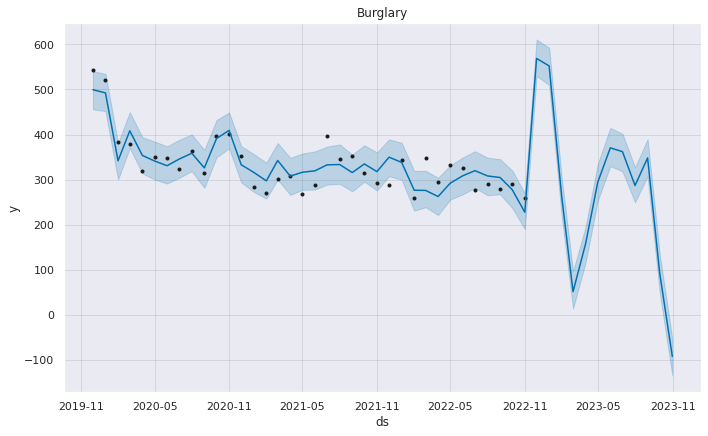

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


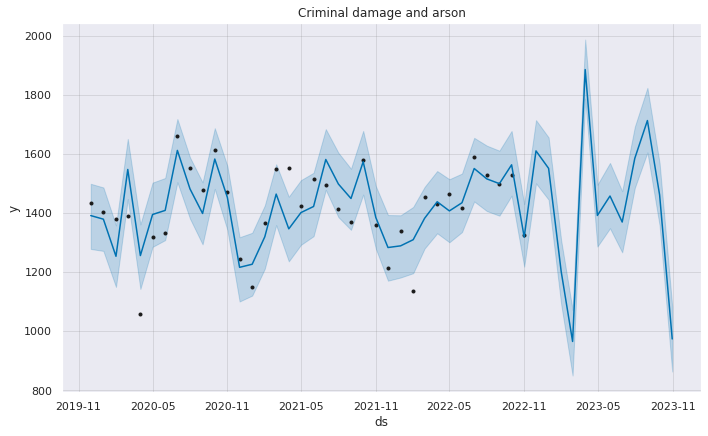

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


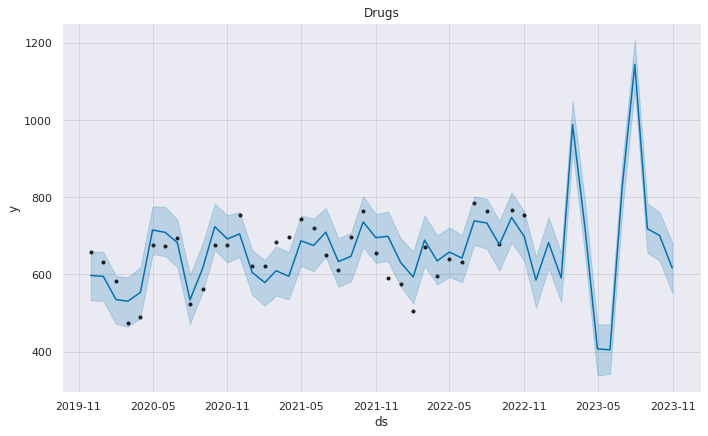

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


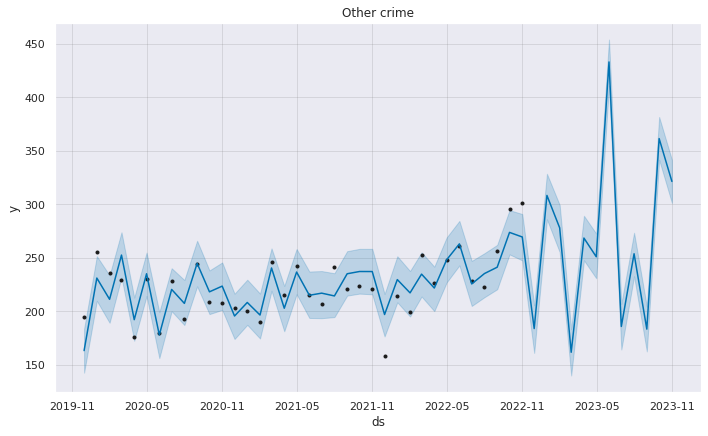

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


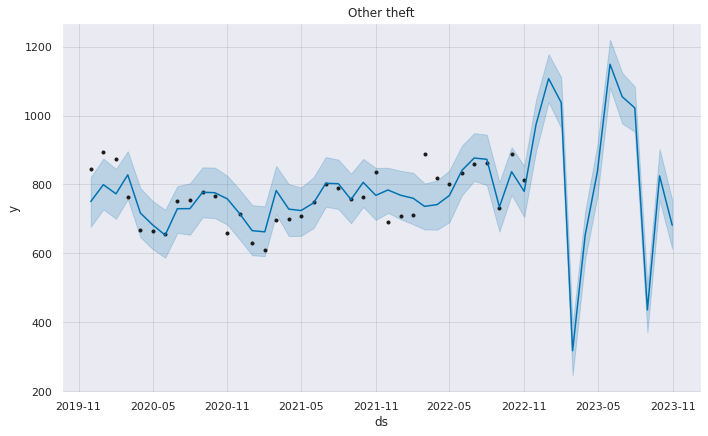

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


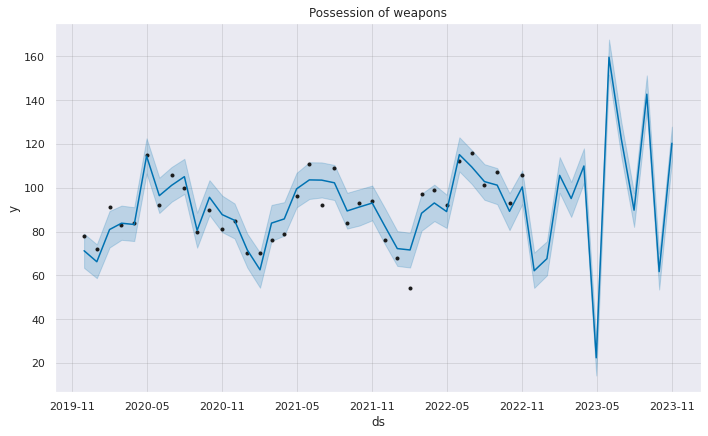

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


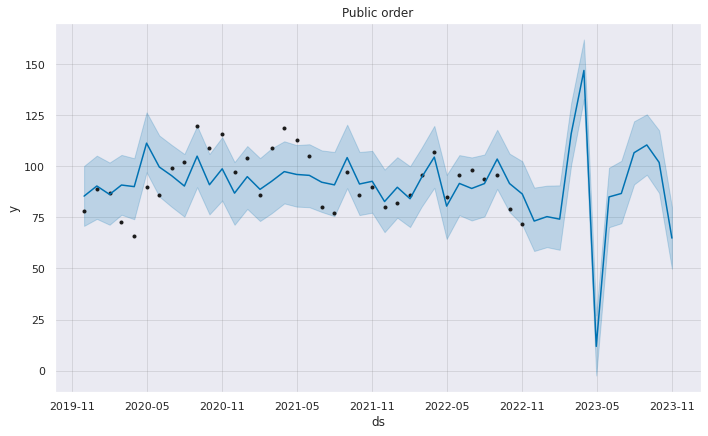

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


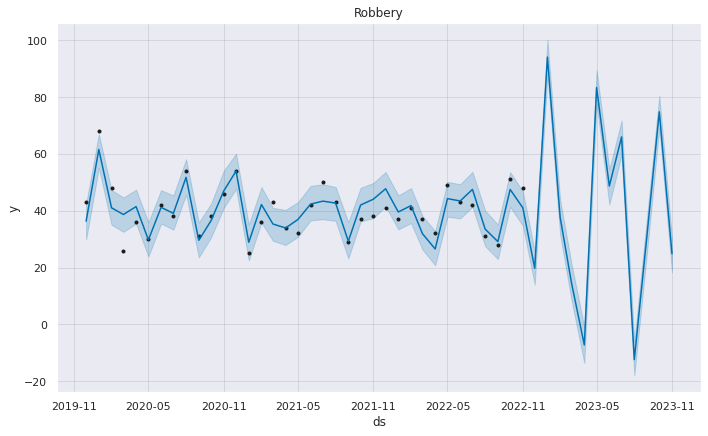

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


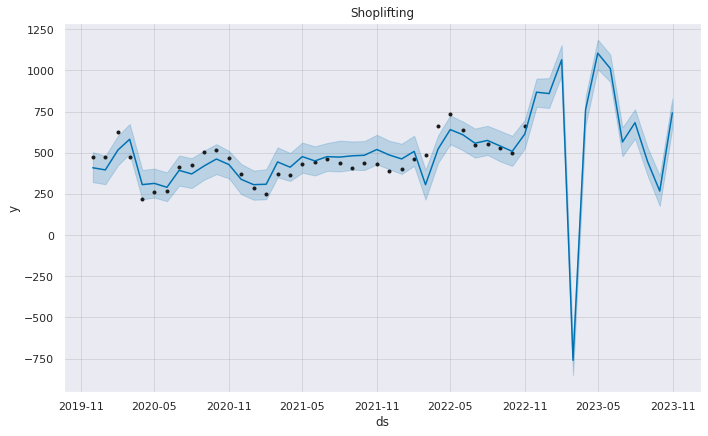

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


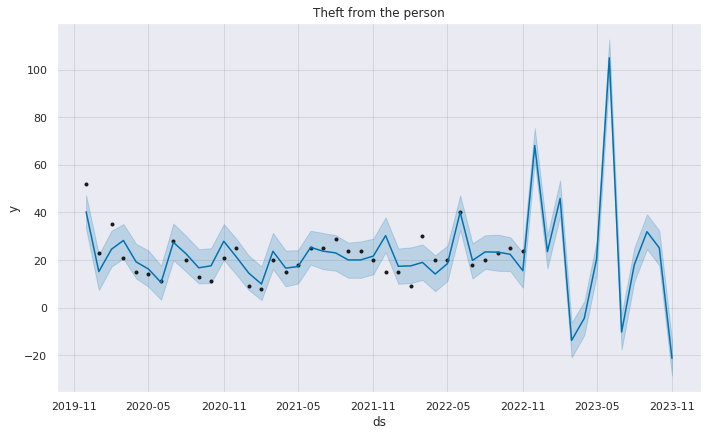

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


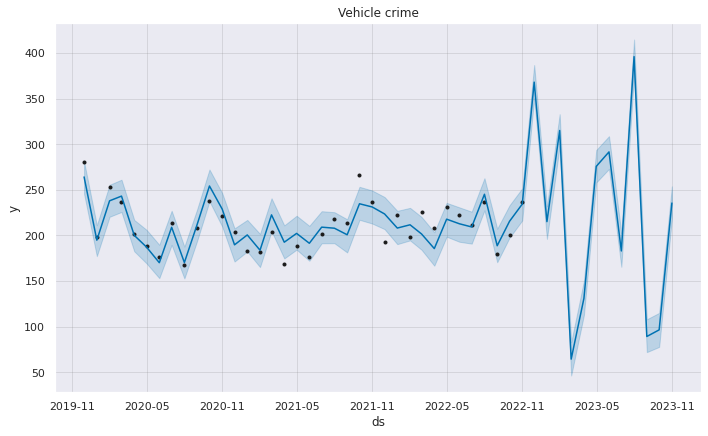

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


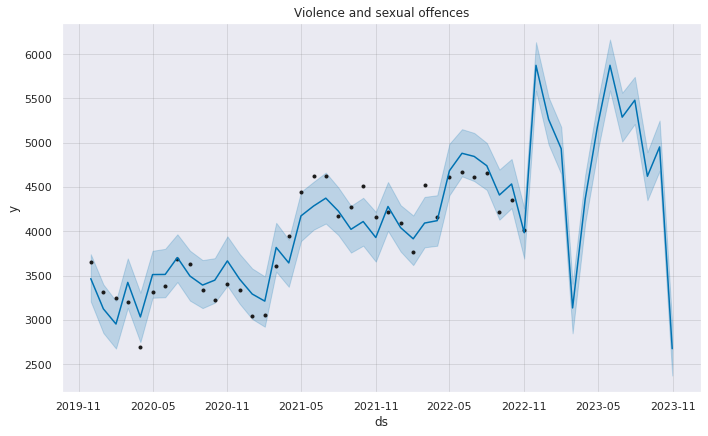

In [ ]:
from fbprophet import Prophet

# Group the data by month and crime type
monthly_data = df.groupby(['Month','Crime type']).size().reset_index(name='counts')

# Create a new dataframe with only the 'Month','Crime type' and 'counts' columns
crime_df = monthly_data[['Month','Crime type','counts']]

# Rename the columns to match the format required by Prophet
crime_df = crime_df.rename(columns={'Month':'ds', 'Crime type':'crime_type', 'counts':'y'})

# create a list of crime types
crime_types = crime_df['crime_type'].unique()

# loop through the crime types and create a Prophet model for each
for crime_type in crime_types:
    # create a dataframe for the current crime type
    df_crime = crime_df[crime_df['crime_type'] == crime_type]

    # Create an instance of the Prophet class
    m = Prophet()

    # Fit the model to the data
    m.fit(df_crime)

    # Create a dataframe to hold the future predictions
    future = m.make_future_dataframe(periods=12, freq='M')

    # Make predictions
    forecast = m.predict(future)

    # Plot the forecast
    fig = m.plot(forecast)
    plt.title(crime_type)
    plt.show()

Here are some interesting forecasts,
- Anti Social Behaviour = Between November 2022 and May 2023, it is forecasted by the graph that there will a sharp increase in these type of crime.
- Bicycle Theft = Between November 2022 and May 2023, it is forecasted by the graph that there will a sharp decrease in these type of crime with it rapidly increasing there after.
- Burglary = Between November 2022 and May 2023, it is forecasted by the graph that there will a sharp increase in these type of crime. And afterwards, a slight decrease and then increase.
- Criminal damage and arson = Between November 2022 and May 2023, it is forecasted by the graph that there will a sharp decrease in these type of crime with it rapidly increasing there after.
- Drugs = Between November 2022 and May 2023, it is forecasted that Drug crime will dip temporarily and then rise and fall again.
- Violences and sexual offences = These type of crime will see a quick rise to the top and then massive falls as forecasted by FbProphet.

# Conclusion
 This project was geared towards finding interesting information about the the crime data for Nothern Ireland found in the Police.UK website. I can say that we were indeed able to find a lot of interesting information regarding the dataset. Below, I will list out some,
 - We found that at least 3 of the columns in the dataset were redundant and data was not properly entered into them.
 - Not a single record was present for the column of `Context`, which looking back is quite concerning, as our world is defined by context.
 - The Latitude and Longitude were found to be non-normal.
 - We also were able to find significant amount to evidence to assume that these three alternate hypothesis are true.

  - `Ha: The crime type and month are not independent`

  - `Ha: The mean of latitude is not equal to the mean of longitude`

  - `Ha: The means of latitude among different crime types are not equal`

- We were able to see the amount of outliers we have in our data.
- The overall crime trend and the individual crime type trend were found and analyzed.
- The `seasonal_decompose` found a strong seasonality in our data, which was supported by the graphs as well.
- Finally, the forecasting down by FbProphet matched what we've been analyzing before.


In [ ]:
time.sleep(5)

In [ ]:
!cp 'drive/My Drive/Colab Notebooks/Exploration And Analysis of Crime Data From Nothern Ireland.ipynb' './'

In [ ]:
!jupyter nbconvert --to pdf './Exploration And Analysis of Crime Data From Nothern Ireland.ipynb' --output-dir="./"